# Introduction

Mes notebook ont été initialisés grâce à plusieurs sources fournies autour du concours [Kaggle](https://www.kaggle.com/c/home-credit-default-risk) sur le risque de défaut de paiement de crédit immobilier : données du crédit immobilier, carnets de notes des concurrents, fils de discussion impliquant l'hôte et les concurrents.

Alors que l'objectif des concurrents est d'obtenir le meilleure score (AUC) par tous les moyens, nous nous concentrerons plutôt sur la capacité à fournir des décisions interprétables, y compris la possibilité d'explorer le cas f'un client.

# Notebooks et tableau de bord
Ce projet comportent 7 Notebook différents :

* Projet7_AED : axé sur l'analyse exploratoire des données
* Projet7_kaggle_FE1_FE2 : axé sur l'ingénierie des caractéristiques
* Projet7_kaggle_FS: axé sur une première sélection des caractéristiques agnostiques du modèle
* Actuel : Projet7_Modelisation_pycaret : se concentre sur l'évaluation de différent modéles
* Projet7_Modelisation : se concentre sur l'amélioration des modéles selectionné précedament
* Projet7_Interprétation : se concentre sur l'interprétation du modèle

+ 2 fichiers python contenant le code du Dashboard et de l'api.

# **IMPORT DES DONNÉES**
Nous importons les données déjà pré-traitées :
* jointures
* aggrégations des variables numériques
* encodage fréquenciel normé des variables catégorielles
* variables sélectionnées sur la base:
    * du taux de remplissage
    * des corrélations
    * de la features importances d'un modèle (LightGBM)
* etc.

## Chargement des librairies

In [1]:
# import 'data stack' libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pycaret

# increase the maximum number of columns to display
pd.set_option("display.max_columns", 1000)  # Maximum number of columns
pd.set_option("display.max_rows", 1000)  # Maximum number of columns

## Chargement des données

In [2]:
train = pd.read_csv('data/raw/m_train_small.csv')
test = pd.read_csv('data/raw/m_test_small.csv')

print('Training set full shape: ', train.shape)
print('Testing set full shape: ' , test.shape)

Training set full shape:  (307511, 344)
Testing set full shape:  (48744, 343)


In [3]:
train.head()

,EXT_SOURCE_1,EXT_SOURCE_2,client_installments_AMT_PAYMENT_min_sum,EXT_SOURCE_3,DAYS_BIRTH,AMT_CREDIT,AMT_ANNUITY,DAYS_EMPLOYED,bureau_DAYS_CREDIT_max,OWN_CAR_AGE,bureau_AMT_CREDIT_SUM_DEBT_mean,bureau_DAYS_CREDIT_ENDDATE_max,DAYS_ID_PUBLISH,bureau_AMT_CREDIT_MAX_OVERDUE_mean,previous_loans_CNT_PAYMENT_mean,client_cash_CNT_INSTALMENT_FUTURE_min_max,bureau_DAYS_ENDDATE_FACT_max,CODE_GENDER_F,DAYS_REGISTRATION,DAYS_LAST_PHONE_CHANGE,previous_loans_NAME_CONTRACT_STATUS_Refused_count_norm,client_installments_DAYS_INSTALMENT_max_max,client_credit_AMT_RECIVABLE_mean_min,client_cash_SK_DPD_DEF_sum_max,REGION_POPULATION_RELATIVE,bureau_AMT_CREDIT_SUM_mean,bureau_DAYS_CREDIT_mean,bureau_AMT_CREDIT_SUM_max,bureau_DAYS_CREDIT_sum,previous_loans_AMT_DOWN_PAYMENT_max,client_cash_CNT_INSTALMENT_max_mean,client_cash_CNT_INSTALMENT_FUTURE_min_mean,client_installments_NUM_INSTALMENT_VERSION_mean_max,client_installments_AMT_INSTALMENT_max_max,client_installments_AMT_PAYMENT_max_min,client_credit_CNT_DRAWINGS_CURRENT_max_max,previous_loans_RATE_DOWN_PAYMENT_sum,client_installments_AMT_PAYMENT_sum_mean,client_installments_AMT_INSTALMENT_min_min,bureau_DAYS_CREDIT_UPDATE_max,bureau_AMT_CREDIT_SUM_DEBT_max,client_credit_AMT_DRAWINGS_CURRENT_mean_max,bureau_AMT_CREDIT_SUM_sum,LANDAREA_AVG,previous_loans_SELLERPLACE_AREA_max,previous_loans_PRODUCT_COMBINATION_Cash X-Sell: low_count_norm,previous_loans_NAME_YIELD_GROUP_high_count_norm,previous_loans_CNT_PAYMENT_max,bureau_DAYS_CREDIT_UPDATE_mean,previous_loans_DAYS_DECISION_mean,previous_loans_DAYS_LAST_DUE_1ST_VERSION_max,bureau_DAYS_CREDIT_ENDDATE_sum,NAME_EDUCATION_TYPE_Higher education,client_cash_MONTHS_BALANCE_sum_mean,AMT_INCOME_TOTAL,previous_loans_RATE_DOWN_PAYMENT_max,bureau_AMT_CREDIT_SUM_min,client_cash_CNT_INSTALMENT_max_max,previous_loans_CNT_PAYMENT_sum,bureau_AMT_CREDIT_SUM_LIMIT_mean,bureau_DAYS_CREDIT_min,NAME_FAMILY_STATUS_Married,APARTMENTS_AVG,bureau_CREDIT_ACTIVE_Active_count,client_installments_AMT_INSTALMENT_min_mean,bureau_CREDIT_TYPE_Mortgage_count_norm,YEARS_BEGINEXPLUATATION_AVG,client_cash_MONTHS_BALANCE_max_mean,client_installments_NUM_INSTALMENT_NUMBER_max_mean,client_installments_NUM_INSTALMENT_VERSION_max_mean,previous_loans_DAYS_FIRST_DUE_min,client_installments_AMT_PAYMENT_mean_sum,client_installments_DAYS_ENTRY_PAYMENT_sum_max,previous_loans_NAME_YIELD_GROUP_low_action_count_norm,previous_loans_HOUR_APPR_PROCESS_START_mean,previous_loans_NAME_CONTRACT_STATUS_Approved_count_norm,previous_loans_DAYS_DECISION_sum,previous_loans_AMT_ANNUITY_mean,previous_loans_AMT_DOWN_PAYMENT_mean,previous_loans_RATE_DOWN_PAYMENT_mean,previous_loans_DAYS_DECISION_max,REGION_RATING_CLIENT,client_cash_MONTHS_BALANCE_sum_max,NAME_CONTRACT_TYPE_Cash loans,client_installments_AMT_PAYMENT_sum_min,client_installments_DAYS_ENTRY_PAYMENT_max_min,client_installments_AMT_INSTALMENT_mean_mean,client_installments_DAYS_INSTALMENT_min_max,BASEMENTAREA_AVG,client_installments_AMT_PAYMENT_max_mean,previous_loans_PRODUCT_COMBINATION_Cash X-Sell: high_count_norm,bureau_AMT_CREDIT_SUM_LIMIT_max,bureau_DAYS_ENDDATE_FACT_min,bureau_DAYS_ENDDATE_FACT_mean,previous_loans_SELLERPLACE_AREA_min,client_installments_AMT_PAYMENT_max_sum,client_cash_NAME_CONTRACT_STATUS_Active_count_norm_mean,client_installments_AMT_INSTALMENT_min_max,bureau_DAYS_CREDIT_ENDDATE_mean,bureau_CREDIT_ACTIVE_Active_count_norm,bureau_DAYS_CREDIT_ENDDATE_min,previous_loans_NAME_YIELD_GROUP_low_normal_count_norm,NONLIVINGAREA_AVG,previous_loans_NAME_PRODUCT_TYPE_walk-in_count_norm,client_installments_DAYS_ENTRY_PAYMENT_min_sum,DEF_60_CNT_SOCIAL_CIRCLE,previous_loans_AMT_ANNUITY_min,client_installments_AMT_INSTALMENT_mean_min,client_cash_CNT_INSTALMENT_mean_min,client_installments_AMT_INSTALMENT_sum_sum,client_installments_NUM_INSTALMENT_VERSION_sum_mean,previous_loans_DAYS_LAST_DUE_1ST_VERSION_min,client_installments_AMT_INSTALMENT_mean_max,client_credit_AMT_DRAWINGS_POS_CURRENT_sum_sum,previous_loans_AMT_GOODS_PRICE_min,client_cash_counts_

## Indexation sur 'SK_ID_CURR'

In [4]:
# Indexing on SK_ID_CURR, both for train and test sets
train = train.set_index('SK_ID_CURR')
test = test.set_index('SK_ID_CURR')

# **EXPLORATION**

## Valeurs dupliquées

In [5]:
# %%flake8  # checking PEP8 compliance

def contains_duplicates(dataframe):
    """This function checks the presence of duplicates rows in a dataframe."""

    mask = dataframe.duplicated(keep='first')
    nb_duplicates = len(dataframe[mask])

    if nb_duplicates == 0:
        return False

    else:
        return True

In [6]:
contains_duplicates(train)

False

## Valeurs manquantes

In [7]:
def global_filling_rate(dataframe):
    """Compute and displays global filling rate of a DataFrame"""

    # get the numbers of rows and columns in the dataframe
    nb_rows, nb_columns = dataframe.shape
    print("DataFrame has {} rows and {} columns.".format(nb_rows, nb_columns))

    # get the number of non-Nan data in the dataframe
    nb_data = dataframe.count().sum()

    # computing the filling rate
    filling_rate = nb_data / (nb_rows * nb_columns)
    missing_rate = 1 - filling_rate

    # computing the total missing values
    missing_values = (nb_rows * nb_columns) - nb_data

    # display global results
    print("")
    print("Global filling rate of the DataFrame: {:.2%}".format(filling_rate))
    print("Missing values in the DataFrame: {} ({:.2%})"
          .format(missing_values, missing_rate))

    # compute number of rows with missing values
    mask = dataframe.isnull().any(axis=1)
    rows_w_missing_values = len(dataframe[mask])
    rows_w_missing_values_percentage = rows_w_missing_values / nb_rows

    # display results
    print("")
    print("Number of rows with missing values: {} ({:.2%})"
          .format(rows_w_missing_values, rows_w_missing_values_percentage))

    # compute number of columns with missing values
    mask = dataframe.isnull().any(axis=0)
    cols_w_missing_values = len(dataframe[dataframe.columns[mask]].columns)
    cols_w_missing_values_percentage = cols_w_missing_values / nb_columns

    # display results
    print("Number of columns with missing values: {} ({:.2%})"
          .format(cols_w_missing_values, cols_w_missing_values_percentage))

In [8]:
global_filling_rate(train)

DataFrame has 307511 rows and 343 columns.

Global filling rate of the DataFrame: 80.67%
Missing values in the DataFrame: 20387003 (19.33%)

Number of rows with missing values: 306625 (99.71%)
Number of columns with missing values: 307 (89.50%)


In [9]:
def columns_filling_rate(dataframe, columns='all', missing_only=False):
    """Calculate and displays the filling rate for
    a particular column in a pd.DataFrame."""
    
    # Importations
    import pandas as pd
    import numpy as np
    
    # If 'feature' is not specified
    if columns == 'all':
        columns = dataframe.columns
        
    
    # initialization of the results DataFrame
    results = pd.DataFrame(columns=['nb_values', 'missing_values', 'filling_rate'])
        
    # for each feature
    for column in columns:

        # Count of the values on each column
        values_count = dataframe[column].count()
        
        # Computing missing values
        nb_rows = dataframe.shape[0]
        missing_values = nb_rows - values_count

        # Computing filling rates
        filling_rate = values_count / nb_rows
        if missing_only and missing_values == 0:
            filling_rate = np.nan
        
        # Adding a row in the results' dataframe
        results.loc[column] = [values_count, missing_values, filling_rate]

    # Sorting the features by number of missing_values
    results = results.dropna(subset=['filling_rate'])
    results = results.sort_values('filling_rate')
    
    if results.empty == False:
        return results
    else:
        print("No missing value.")

In [10]:
global_filling_rate(train)

DataFrame has 307511 rows and 343 columns.

Global filling rate of the DataFrame: 80.67%
Missing values in the DataFrame: 20387003 (19.33%)

Number of rows with missing values: 306625 (99.71%)
Number of columns with missing values: 307 (89.50%)


In [11]:
# Dropping the columns where filling rate < 80%
# ----------------------------------------------

def get_features_under_filling_threshold(features_df, threshold=0.9):
    # computing the filling rates
    col_fillings = columns_filling_rate(features_df, columns='all', missing_only=True)

    # creating a mask for filling rate < threshold
    mask = col_fillings['filling_rate'] < threshold

    # getting the list of features
    set_cols_to_delete = set(col_fillings[mask].index)
    return set_cols_to_delete


set_cols_to_delete_train = get_features_under_filling_threshold(train, threshold=0.9)
set_cols_to_delete_test = get_features_under_filling_threshold(train, threshold=0.9)
set_cols_to_delete = set_cols_to_delete_train.union(set_cols_to_delete_test)

# deleting the rows both in train set and test set
train = train.drop(columns=set_cols_to_delete)
test = test.drop(columns=set_cols_to_delete)

global_filling_rate(train)
print(train.shape)
print(test.shape)

DataFrame has 307511 rows and 218 columns.

Global filling rate of the DataFrame: 95.60%
Missing values in the DataFrame: 2951272 (4.40%)

Number of rows with missing values: 21836 (7.10%)
Number of columns with missing values: 182 (83.49%)
(307511, 218)
(48744, 217)


In [12]:
columns_filling_rate(train, columns='all', missing_only=True)

,nb_values,missing_values,filling_rate
client_cash_CNT_INSTALMENT_max_max,289420.0,18091.0,0.941170
client_cash_CNT_INSTALMENT_min_min,289420.0,18091.0,0.941170
client_cash_CNT_INSTALMENT_FUTURE_min_max,289420.0,18091.0,0.941170
client_cash_CNT_INSTALMENT_mean_min,289420.0,18091.0,0.941170
client_cash_CNT_INSTALMENT_min_mean,289420.0,18091.0,0.941170
client_cash_CNT_INSTALMENT_max_mean,289420.0,18091.0,0.941170
client_cash_CNT_INSTALMENT_FUTURE_min_mean,289420.0,18091.0,0.941170
client_cash_MONTHS_BALANCE_max_mean,289444.0,18067.0,0.941248
client_cash_NAME_CONTRACT_STATUS_Active_count_max,289444.0,18067.0,0.941248
client_cash_NAME_CONTRACT_STATUS_Active_count_min,289444.0,18067.0,0.941248


In [13]:
def filtering_rows(df, threshold=0.9):

    import seaborn as sns

    # Compute the filling rates of each row
    filling_rate_rows = df.notna().mean(axis=1)

    # Display the histogram and KDE of the distribution
    ax = sns.distplot(filling_rate_rows, kde=False)

    # Create a mask for rows where filling rate is above threhold
    mask = filling_rate_rows > threshold

    # Filtering the DataFrame
    filtered_df = df[mask]

    # Display the results
    print('Threshold for filling rate:', threshold)
    print('Rows under threshold:', len(df) - len(filtered_df))
    print('Rows above threshold:', len(filtered_df))

    # Return the filtered DataFrame
    return filtered_df

Threshold for filling rate: 0.9
Rows under threshold: 19483
Rows above threshold: 288028


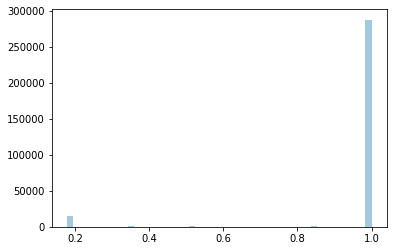

In [14]:
train = filtering_rows(train, threshold=0.9)

## Typage des données

In [15]:
train.describe()

,EXT_SOURCE_2,client_installments_AMT_PAYMENT_min_sum,DAYS_BIRTH,AMT_CREDIT,AMT_ANNUITY,DAYS_EMPLOYED,DAYS_ID_PUBLISH,previous_loans_CNT_PAYMENT_mean,client_cash_CNT_INSTALMENT_FUTURE_min_max,CODE_GENDER_F,DAYS_REGISTRATION,DAYS_LAST_PHONE_CHANGE,previous_loans_NAME_CONTRACT_STATUS_Refused_count_norm,client_installments_DAYS_INSTALMENT_max_max,client_cash_SK_DPD_DEF_sum_max,REGION_POPULATION_RELATIVE,client_cash_CNT_INSTALMENT_max_mean,client_cash_CNT_INSTALMENT_FUTURE_min_mean,client_installments_NUM_INSTALMENT_VERSION_mean_max,client_installments_AMT_INSTALMENT_max_max,client_installments_AMT_PAYMENT_max_min,previous_loans_RATE_DOWN_PAYMENT_sum,client_installments_AMT_PAYMENT_sum_mean,client_installments_AMT_INSTALMENT_min_min,previous_loans_SELLERPLACE_AREA_max,previous_loans_PRODUCT_COMBINATION_Cash X-Sell: low_count_norm,previous_loans_NAME_YIELD_GROUP_high_count_norm,previous_loans_CNT_PAYMENT_max,previous_loans_DAYS_DECISION_mean,previous_loans_DAYS_LAST_DUE_1ST_VERSION_max,NAME_EDUCATION_TYPE_Higher education,client_cash_MONTHS_BALANCE_sum_mean,AMT_INCOME_TOTAL,client_cash_CNT_INSTALMENT_max_max,previous_loans_CNT_PAYMENT_sum,NAME_FAMILY_STATUS_Married,client_installments_AMT_INSTALMENT_min_mean,client_cash_MONTHS_BALANCE_max_mean,client_installments_NUM_INSTALMENT_NUMBER_max_mean,client_installments_NUM_INSTALMENT_VERSION_max_mean,previous_loans_DAYS_FIRST_DUE_min,client_installments_AMT_PAYMENT_mean_sum,client_installments_DAYS_ENTRY_PAYMENT_sum_max,previous_loans_NAME_YIELD_GROUP_low_action_count_norm,previous_loans_HOUR_APPR_PROCESS_START_mean,previous_loans_NAME_CONTRACT_STATUS_Approved_count_norm,previous_loans_DAYS_DECISION_sum,previous_loans_AMT_ANNUITY_mean,previous_loans_DAYS_DECISION_max,REGION_RATING_CLIENT,client_cash_MONTHS_BALANCE_sum_max,NAME_CONTRACT_TYPE_Cash loans,client_installments_AMT_PAYMENT_sum_min,client_installments_DAYS_ENTRY_PAYMENT_max_min,client_installments_AMT_INSTALMENT_mean_mean,client_installments_DAYS_INSTALMENT_min_max,client_installments_AMT_PAYMENT_max_mean,previous_loans_PRODUCT_COMBINATION_Cash X-Sell: high_count_norm,previous_loans_SELLERPLACE_AREA_min,client_installments_AMT_PAYMENT_max_sum,client_cash_NAME_CONTRACT_STATUS_Active_count_norm_mean,client_installments_AMT_INSTALMENT_min_max,previous_loans_NAME_YIELD_GROUP_low_normal_count_norm,previous_loans_NAME_PRODUCT_TYPE_walk-in_count_norm,client_installments_DAYS_ENTRY_PAYMENT_min_sum,DEF_60_CNT_SOCIAL_CIRCLE,previous_loans_AMT_ANNUITY_min,client_installments_AMT_INSTALMENT_mean_min,client_cash_CNT_INSTALMENT_mean_min,client_installments_AMT_INSTALMENT_sum_sum,client_installments_NUM_INSTALMENT_VERSION_sum_mean,previous_loans_DAYS_LAST_DUE_1ST_VERSION_min,client_installments_AMT_INSTALMENT_mean_max,previous_loans_AMT_GOODS_PRICE_min,client_cash_counts_mean,client_cash_SK_DPD_max_sum,previous_loans_AMT_ANNUITY_max,previous_loans_DAYS_LAST_DUE_sum,client_installments_AMT_INSTALMENT_min_sum,FLAG_DOCUMENT_3,previous_loans_NAME_CLIENT_TYPE_Refreshed_count_norm,client_cash_CNT_INSTALMENT_FUTURE_min_sum,client_cash_CNT_INSTALMENT_min_mean,client_cash_NAME_CONTRACT_STATUS_Completed_count_norm_mean,HOUR_APPR_PROCESS_START,previous_loans_NAME_PRODUCT_TYPE_XNA_count_norm,previous_loans_NAME_TYPE_SUITE_Unaccompanied_count_norm,previous_loans_NAME_PORTFOLIO_POS_count_norm,previous_loans_DAYS_TERMINATION_min,previous_loans_AMT_APPLICATION_max,DEF_30_CNT_SOCIAL_CIRCLE,previous_loans_PRODUCT_COMBINATION_Cash Street: low_count_norm,previous_loans_DAYS_FIRST_DUE_mean,client_cash_CNT_INSTALMENT_sum_min,previous_loans_PRODUCT_COMBINATION_POS industry with interest_count_norm,previous_loans_AMT_CREDIT_min,client_installments_NUM_INSTALMENT_VERSION_sum_sum,NAME_INCOME_TYPE_Working,client_cash_counts_sum,REG_CITY_NOT_LIVE_CITY,previous_loans_NAME_YIELD_GROUP_middle_count_norm,FLAG_DOCUMENT_18,previous_loans_CODE_REJECT_REASON_HC_count_norm,previous_loans_NAME_CLIENT_TYPE_New_count_norm,NAME_EDUCATION_TYPE_Secondary / secondary special,previous_lo

In [16]:
train.dtypes

EXT_SOURCE_2                                                                    float64
client_installments_AMT_PAYMENT_min_sum                                         float64
DAYS_BIRTH                                                                        int64
AMT_CREDIT                                                                      float64
AMT_ANNUITY                                                                     float64
DAYS_EMPLOYED                                                                     int64
DAYS_ID_PUBLISH                                                                   int64
previous_loans_CNT_PAYMENT_mean                                                 float64
client_cash_CNT_INSTALMENT_FUTURE_min_max                                       float64
CODE_GENDER_F                                                                     int64
DAYS_REGISTRATION                                                               float64
DAYS_LAST_PHONE_CHANGE          

## Équilibre des classes

In [17]:
def categorical_distribution(dataframe, feature, ordinal=False):
    """Function plotting the bar-plot and pie-plot (as subplots) for 
    a distribution of categorical features."""
    
    # importing libraries
    import matplotlib.pyplot as plt

    # filtering non-null data for the feature
    mask = dataframe[feature].notnull()
    data_view = dataframe[mask]
    
    # Setting the data to plot
    x=data_view[feature]
    
    # Set frequencies and labels, sorting by index
    if ordinal==True:
        labels = list(x.value_counts().sort_index().index.astype(str))
        frequencies = x.value_counts().sort_index()
    else:
        labels = list(x.value_counts().sort_values(ascending=False).index.astype(str))
        frequencies = x.value_counts().sort_values(ascending=False)
    
    # Graphical properties of the main figure
    fig = plt.figure(figsize=(14, 6))
    
    plt.suptitle("Empiric statistical distribution: " + feature, fontsize=25)
    
    # Main graphical properties of the first subplot (histogram)
    ax1 = plt.subplot(121)
    ax1.set_xlabel("Values", fontsize=20)
    ax1.set_ylabel("Frequencies", fontsize=20)
    ax1.set_xticklabels(labels, rotation='45', horizontalalignment="right")

    # Main graphical properties of the second subplot (pieplot)
    ax2 = plt.subplot(122)
    ax2.set_xlabel("Relative frequencies", fontsize=20)
    
    # plotting the plots
    ax1.bar(labels, frequencies)
    ax2.pie(frequencies,
            autopct='%1.2f%%',
            shadow=True,
              )
    
    ax2.legend(labels)
    plt.show()
    return fig

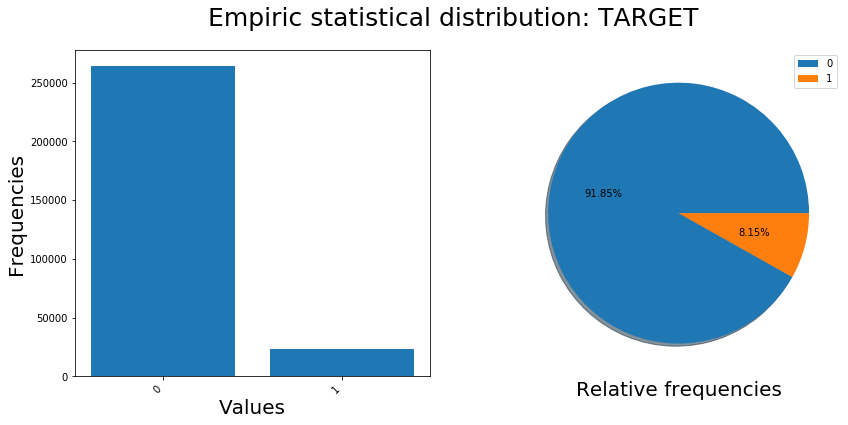

In [18]:
fig = categorical_distribution(
    train,
    'TARGET'
)

fig.savefig('plots/imba_classes.png')

## Enregistrer les données prétraitées

In [19]:
train.to_csv('data/cleaned/data_train_featured.csv')

# **PRÉPARATION**

In [1]:
import pandas as pd

train = pd.read_csv('data/cleaned/data_train_featured.csv', index_col='SK_ID_CURR')

## **SETUP** de pycaret

The setup() function initializes the environment in pycaret and creates the transformation pipeline to prepare the data for modeling and deployment. 

    The default division ratio is 70:30 (as we see in above paragraph), but can be changed with "train_size".
    K-fold cross-validation is set to 10 by default
    "session_id" is our classic "random_state"
    the Fix_imbalanced parameter aim to unscreew data during the training by appling SMOTE,
     I also choose to apply a feature selection and to remove colums who are to much corelated.

In [3]:
## setting up the environment
from pycaret.classification import *

model_setup = setup(data=train, target='TARGET', fix_imbalance = True, 
session_id=123)

,Description,Value
0,session_id,123
1,Target,TARGET
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(288028, 218)"
5,Missing Values,True
6,Numeric Features,188
7,Categorical Features,29
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:

## setting up the environment
from pycaret.classification import *

model_setup = setup(data=train, target='TARGET', fix_imbalance = True, remove_multicollinearity = True, multicollinearity_threshold = 0.6,
feature_selection = True,
feature_selection_threshold= 0.9,
session_id=123)

In [4]:
# check all metrics used for model evaluation
get_metrics()

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Multiclass,Custom
ID,,,,,,,,,
acc,Accuracy,Accuracy,<function accuracy_score at 0x000002A481889EE8>,accuracy,pred,{},True,True,False
auc,AUC,AUC,<function roc_auc_score at 0x000002A48187F1F8>,"make_scorer(roc_auc_score, needs_proba=True, e...",pred_proba,"{'average': 'weighted', 'multi_class': 'ovr'}",True,True,False
recall,Recall,Recall,<function binary_multiclass_score_func.<locals...,"make_scorer(wrapper, average=macro)",pred,{'average': 'macro'},True,True,False
precision,Precision,Prec.,<function binary_multiclass_score_func.<locals...,"make_scorer(wrapper, average=weighted)",pred,{'average': 'weighted'},True,True,False
f1,F1,F1,<function binary_multiclass_score_func.<locals...,"make_scorer(wrapper, average=weighted)",pred,{'average': 'weighted'},True,True,False
kappa,Kappa,Kappa,<function cohen_kappa_score at 0x000002A48188D...,make_scorer(cohen_kappa_score),pred,{},True,True,False
mcc,MCC,MCC,<function matthews_corrcoef at 0x000002A48188D...,make_scorer(matthews_corrcoef),pred,{},True,True,False


# Compare Models

In [5]:
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9185,0.6951,0.0042,0.5326,0.0083,0.0070,0.0413,49.7120
lightgbm,Light Gradient Boosting Machine,0.9185,0.7372,0.0123,0.5119,0.0240,0.0202,0.0693,8.3250
rf,Random Forest Classifier,0.9183,0.6943,0.0033,0.4260,0.0066,0.0054,0.0313,61.0790
gbc,Gradient Boosting Classifier,0.9183,0.7050,0.0064,0.4695,0.0127,0.0105,0.0471,232.7220
catboost,CatBoost Classifier,0.9181,0.7378,0.0249,0.4630,0.0472,0.0391,0.0922,117.7640
xgboost,Extreme Gradient Boosting,0.9176,0.7269,0.0304,0.4297,0.0567,0.0465,0.0968,121.2650
ada,Ada Boost Classifier,0.9115,0.6547,0.0312,0.2103,0.0540,0.0340,0.0519,49.6870
dt,Decision Tree Classifier,0.8388,0.5323,0.1659,0.1270,0.1438,0.0566,0.0573,11.6610
knn,K Neighbors Classifier,0.6827,0.5435,0.3508,0.0977,0.1528,0.0289,0.0379,27.0890
ridge,Ridge Classifier,0.6793,0.0000,0.6585,0.1550,0.2510,0.1370,0.1954,2.8370


In [6]:
print(best_model)

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)


Considérant que l'on cherche a tout prix eviter des faux negatife, l'on vas favoriser les metrics recall et AUC. Nous allonspour la suite de ce notebook travailler avec les 3 algorithme suivant:
qda(quadratic discriminant analysis) pour sont tres bon recall et sa rapidité
ridge(ridge classifier)  pour sont bon F1 et sa rapidité
lightgbm (light gradient boosting machine) qui devrais nous donner le meilleur modéles.

# Create the model


In [4]:
#qda = create_model("qda")
lightgbm = create_model("lightgbm")
#ridge = create_model("ridge")

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9180,0.7388,0.0122,0.4082,0.0236,0.0190,0.0589
1,0.9185,0.7439,0.0116,0.5278,0.0226,0.0192,0.0689
2,0.9186,0.7443,0.0097,0.5517,0.0191,0.0163,0.0652
3,0.9184,0.7423,0.0122,0.5000,0.0237,0.0199,0.0681
4,0.9184,0.7413,0.0103,0.4857,0.0202,0.0169,0.0616
5,0.9179,0.7413,0.0109,0.3913,0.0213,0.0169,0.0541
6,0.9185,0.7414,0.0140,0.5111,0.0272,0.0230,0.0742
7,0.9191,0.7388,0.0134,0.7097,0.0263,0.0233,0.0900
8,0.9181,0.7474,0.0097,0.4211,0.0190,0.0154,0.0539
9,0.9190,0.7478,0.0140,0.6571,0.0274,0.0241,0.0877


In [6]:
ridge = create_model("ridge")

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6834,0.0000,0.6582,0.1567,0.2532,0.1399,0.1983
1,0.6848,0.0000,0.6602,0.1578,0.2547,0.1417,0.2004
2,0.6857,0.0000,0.6717,0.1601,0.2586,0.1461,0.2070
3,0.6858,0.0000,0.6760,0.1609,0.2599,0.1475,0.2092
4,0.6896,0.0000,0.6699,0.1616,0.2604,0.1485,0.2090
5,0.6876,0.0000,0.6602,0.1591,0.2564,0.1439,0.2026
6,0.6846,0.0000,0.6760,0.1603,0.2591,0.1465,0.2082
7,0.6840,0.0000,0.6650,0.1582,0.2556,0.1426,0.2022
8,0.6828,0.0000,0.6723,0.1589,0.2570,0.1440,0.2050
9,0.6891,0.0000,0.6691,0.1612,0.2598,0.1478,0.2082


In [10]:
lda = create_model("lda")

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6833,0.7346,0.6588,0.1568,0.2533,0.1400,0.1985
1,0.6851,0.7368,0.6596,0.1578,0.2547,0.1417,0.2004
2,0.6855,0.7420,0.6705,0.1598,0.2581,0.1455,0.2062
3,0.6856,0.7408,0.6760,0.1607,0.2597,0.1473,0.2090
4,0.6894,0.7411,0.6711,0.1618,0.2607,0.1488,0.2095
5,0.6873,0.7393,0.6590,0.1588,0.2559,0.1432,0.2018
6,0.6848,0.7376,0.6760,0.1604,0.2592,0.1467,0.2084
7,0.6844,0.7329,0.6657,0.1585,0.2561,0.1431,0.2029
8,0.6826,0.7434,0.6723,0.1587,0.2569,0.1438,0.2048
9,0.6890,0.7447,0.6679,0.1609,0.2594,0.1473,0.2075


# Tunning the model

## Optimize threshold 

In [15]:
tuned_lightgbm = tune_model(lightgbm,optimize = 'MCC')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9123,0.6943,0.0554,0.2974,0.0933,0.0695,0.0979
1,0.9146,0.6971,0.0675,0.3725,0.1143,0.0915,0.1302
2,0.9141,0.7060,0.0723,0.3673,0.1209,0.0966,0.1334
3,0.9128,0.7137,0.0608,0.3185,0.1021,0.0780,0.1088
4,0.9127,0.7004,0.0529,0.3000,0.0899,0.0671,0.0964
5,0.9127,0.6941,0.0590,0.3129,0.0992,0.0753,0.1056
6,0.9143,0.7048,0.0705,0.3683,0.1184,0.0946,0.1319
7,0.9123,0.6944,0.0590,0.3060,0.0989,0.0745,0.1036
8,0.9134,0.7039,0.0644,0.3387,0.1083,0.0844,0.1179
9,0.9133,0.7014,0.0633,0.3344,0.1064,0.0826,0.1157


In [9]:
tuned_ridge = tune_model(ridge,optimize = 'MCC')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6833,0.0000,0.6600,0.1570,0.2536,0.1404,0.1991
1,0.6850,0.0000,0.6608,0.1580,0.2550,0.1420,0.2008
2,0.6860,0.0000,0.6723,0.1603,0.2589,0.1465,0.2075
3,0.6857,0.0000,0.6766,0.1609,0.2600,0.1476,0.2094
4,0.6889,0.0000,0.6705,0.1614,0.2602,0.1482,0.2088
5,0.6876,0.0000,0.6602,0.1591,0.2564,0.1439,0.2026
6,0.6846,0.0000,0.6760,0.1603,0.2591,0.1465,0.2082
7,0.6840,0.0000,0.6638,0.1580,0.2553,0.1422,0.2017
8,0.6832,0.0000,0.6742,0.1593,0.2578,0.1449,0.2062
9,0.6892,0.0000,0.6673,0.1609,0.2593,0.1473,0.2073


In [14]:
tuned_lda = tune_model(lda, optimize = 'MCC')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.4963,0.7050,0.8054,0.1186,0.2068,0.0754,0.1509
1,0.5362,0.6739,0.7313,0.1190,0.2046,0.0748,0.1369
2,0.5081,0.6954,0.7866,0.1191,0.2069,0.0760,0.1482
3,0.5509,0.6830,0.7307,0.1225,0.2098,0.0814,0.1455
4,0.5046,0.7139,0.8097,0.1210,0.2106,0.0799,0.1579
5,0.4834,0.6980,0.8067,0.1161,0.2031,0.0705,0.1444
6,0.3966,0.6687,0.8371,0.1037,0.1846,0.0461,0.1123
7,0.5391,0.6721,0.7325,0.1198,0.2059,0.0764,0.1393
8,0.5439,0.6727,0.7179,0.1191,0.2044,0.0749,0.1349
9,0.4994,0.6801,0.7640,0.1146,0.1993,0.0670,0.1318


In [23]:
# optimize threshold for trained model
optimize_threshold(tuned_lightgbm, true_negative = 1500, false_negative = -5000)

Optimized Probability Threshold: 0.3788 | Optimized Cost Function: 85003000


0.3788

In [22]:
optimize_threshold(tuned_lda, true_negative = 1500, false_negative = -5000)

Optimized Probability Threshold: 0.8637 | Optimized Cost Function: 84255000


0.8637

# Plotting the model

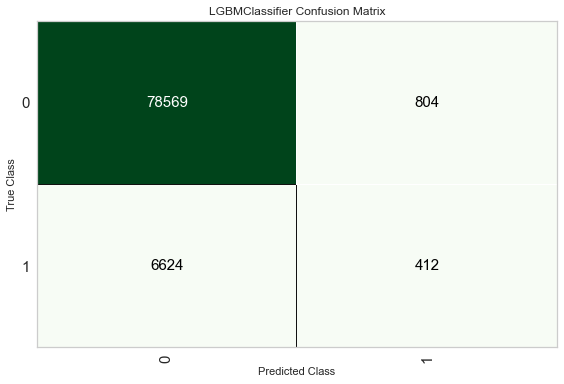

In [25]:
plot_model(tuned_lightgbm, plot = 'confusion_matrix')

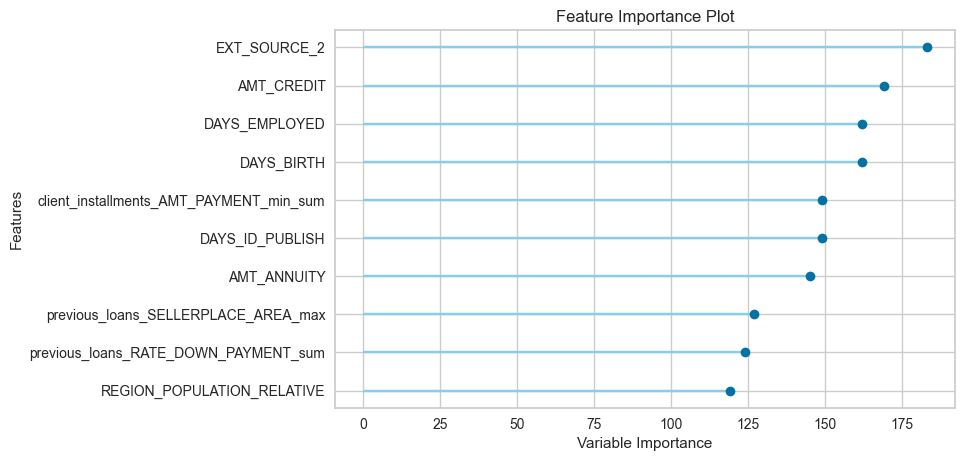

In [32]:
plot_model(tuned_lightgbm, plot='feature')

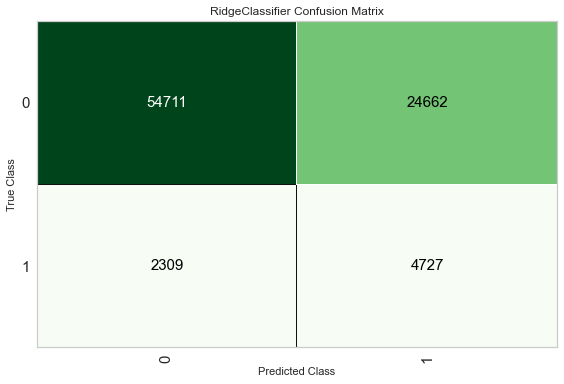

In [18]:
plot_model(tuned_ridge, plot = 'confusion_matrix')

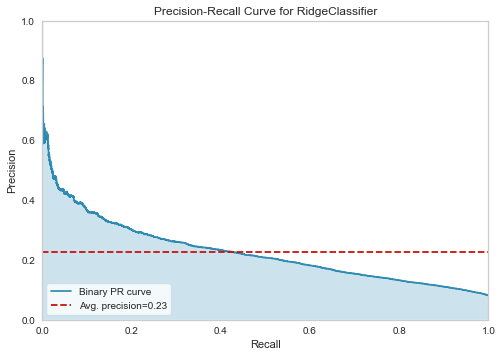

In [26]:
plot_model(tuned_ridge, plot = 'pr')

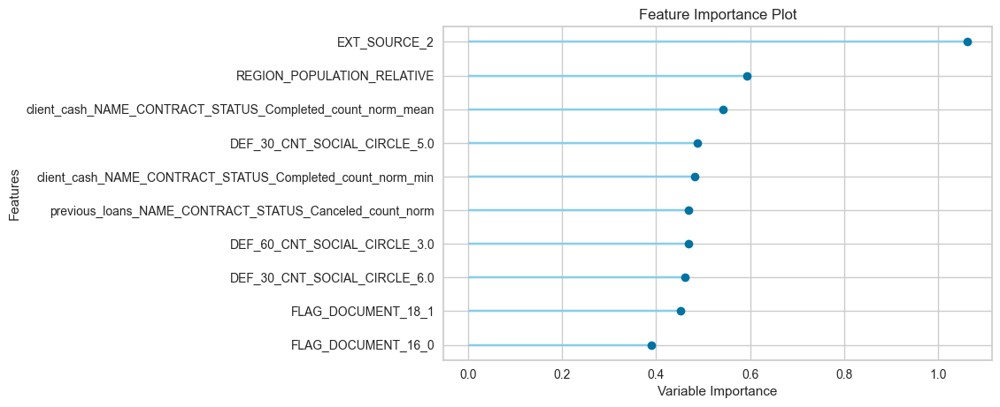

In [27]:
## feature importance

plot_model(tuned_ridge, plot='feature')

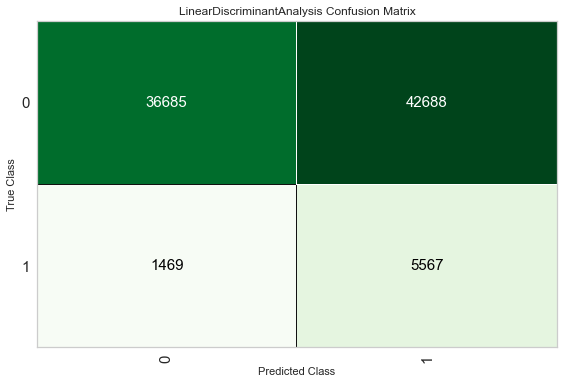

In [24]:
## Consufion matrix
plot_model(tuned_lda, plot = 'confusion_matrix')

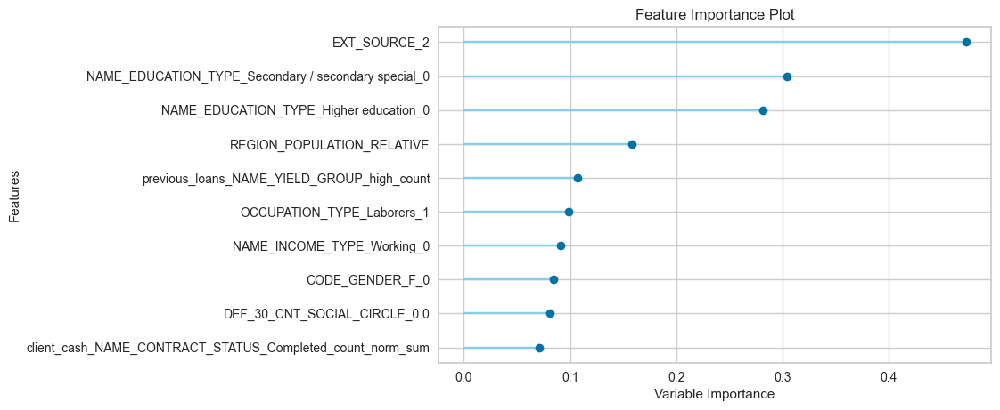

In [31]:
plot_model(tuned_lda, plot='feature')

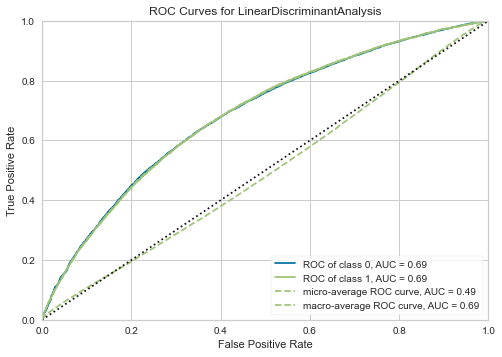

In [30]:
plot_model(tuned_lda, plot = 'auc')

# Conclusion

Les 3 modelés précèdent présente des scores intéressants. 
Ils ont cependant un nombre très différent de faux négatif ( lda : 1469, ridge: 2049, Lightgbm: 6624). 
Nous allons donc procéder dans le prochain notebook a une optimisation bayesienne afin de les optimiser avant de faire une dernière comparaison.